# DAL Assignment 9
#### Submitted By : Harshil Pandey (DA24C006)

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
from matplotlib import offsetbox
from PIL import Image
from sklearn.manifold import TSNE
from sklearn.manifold import Isomap

# Task 1

In [ ]:
train_data=pd.read_csv('/kaggle/input/visual-taxonomy/train.csv')

In [6]:
train_data['Category'].unique()

array(['Men Tshirts', 'Sarees', 'Kurtis', 'Women Tshirts',
       'Women Tops & Tunics'], dtype=object)

In [7]:
basket={}

### Men Tshirts

In [8]:
train_subset=train_data.loc[train_data['Category']=='Men Tshirts', :]
train_subset

train_subset.isnull().sum(axis=0)

select_attr=['id', 'attr_1']
basket['Men Tshirts__attr_1']=train_subset[select_attr].dropna().sample(n=100, random_state=0)['id'].values

select_attr=['id', 'attr_2']
basket['Men Tshirts__attr_2']=train_subset[select_attr].dropna().sample(n=100, random_state=0)['id'].values

### Sarees

In [9]:
train_subset=train_data.loc[train_data['Category']=='Sarees', :]
train_subset

train_subset.isnull().sum(axis=0)

select_attr=['id', 'attr_4']
basket['Sarees__attr_4']=train_subset[select_attr].dropna().sample(n=100, random_state=0)['id'].values

select_attr=['id', 'attr_9']
basket['Sarees__attr_9']=train_subset[select_attr].dropna().sample(n=100, random_state=0)['id'].values

### Kurtis

In [10]:
train_subset=train_data.loc[train_data['Category']=='Kurtis', :]
train_subset

train_subset.isnull().sum(axis=0)

select_attr=['id', 'attr_1']
basket['Kurtis__attr_1']=train_subset[select_attr].dropna().sample(n=100, random_state=0)['id'].values

select_attr=['id', 'attr_8']
basket['Kurtis__attr_8']=train_subset[select_attr].dropna().sample(n=100, random_state=0)['id'].values

### Women Tshirts

In [11]:
train_subset=train_data.loc[train_data['Category']=='Women Tshirts', :]
train_subset

train_subset.isnull().sum(axis=0)

select_attr=['id', 'attr_1']
basket['Women Tshirts__attr_1']=train_subset[select_attr].dropna().sample(n=100, random_state=0)['id'].values

select_attr=['id', 'attr_5']
basket['Women Tshirts__attr_5']=train_subset[select_attr].dropna().sample(n=100, random_state=0)['id'].values

### Women Tops & Tunics

In [12]:
train_subset=train_data.loc[train_data['Category']=='Women Tops & Tunics', :]
train_subset

train_subset.isnull().sum(axis=0)

select_attr=['id', 'attr_1']
basket['Women Tops & Tunics__attr_1']=train_subset[select_attr].dropna().sample(n=100, random_state=0)['id'].values

select_attr=['id', 'attr_8']
basket['Women Tops & Tunics__attr_8']=train_subset[select_attr].dropna().sample(n=100, random_state=0)['id'].values

# Task 2

In [13]:
def load_data(prod_ids):
    images=[]
    data=[]
    for prod_id in prod_ids:
        file_name='/kaggle/input/visual-taxonomy/train_images/{number:06}.jpg'.format(number=prod_id)
        image=Image.open(file_name)
        image=image.resize((64, 64))
        images.append(image)
        data.append(np.asarray(image.getdata()).flatten())

    data=np.array(data)
    return data, images

    

In [14]:
def plot_components(data, model, images=None, ax=None,
                    thumb_frac=0.05, cmap='gray'):
    ax = ax or plt.gca()

    proj = model.fit_transform(data)
    ax.plot(proj[:, 0], proj[:, 1], '.k')

    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                # don't show points that are too close
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], cmap=cmap),
                                      proj[i])
            ax.add_artist(imagebox)
    
    plt.axis('off')

In [15]:
basket.keys()

dict_keys(['Men Tshirts__attr_1', 'Men Tshirts__attr_2', 'Sarees__attr_4', 'Sarees__attr_9', 'Kurtis__attr_1', 'Kurtis__attr_8', 'Women Tshirts__attr_1', 'Women Tshirts__attr_5', 'Women Tops & Tunics__attr_1', 'Women Tops & Tunics__attr_8'])

### Men Tshirts__attr_1

In [16]:
data, images=load_data(basket['Men Tshirts__attr_1'])

####  tsne

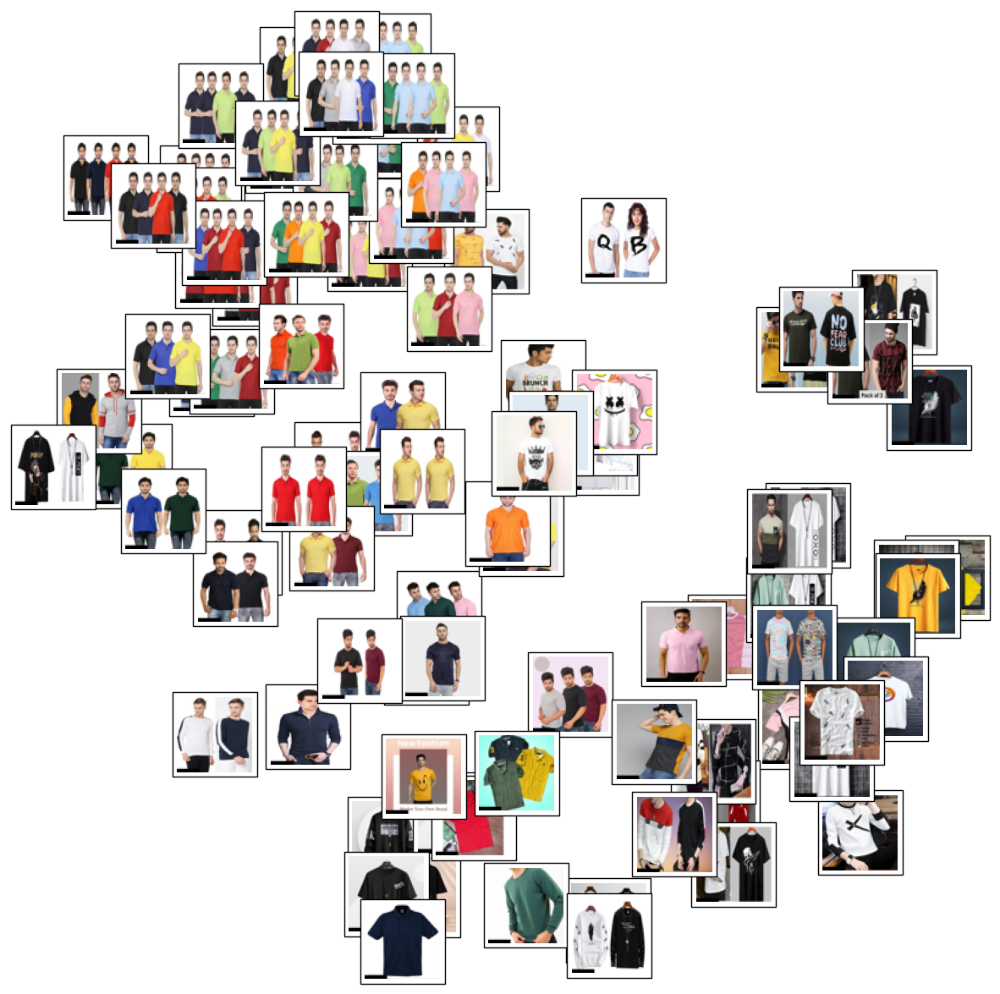

In [17]:
plot_components(data, TSNE(n_components=2, random_state=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

#### Isomap

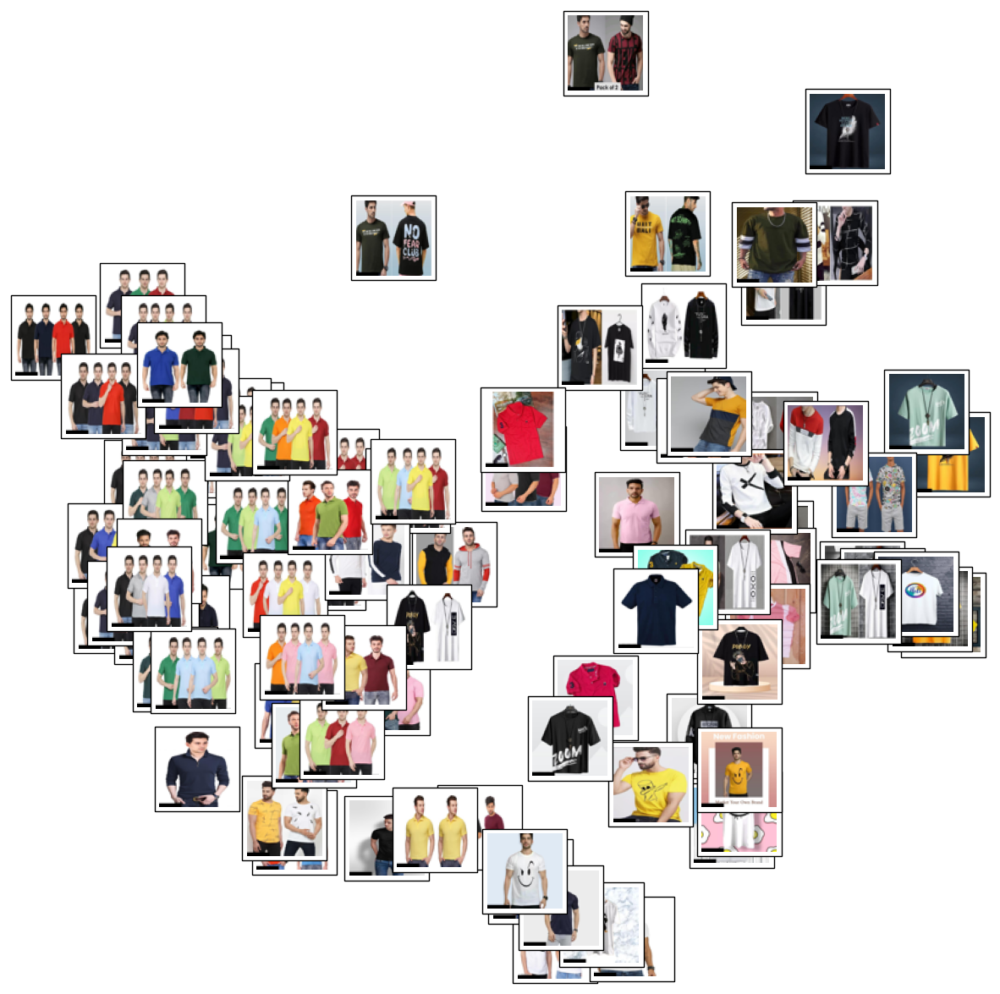

In [18]:
plot_components(data, Isomap(n_components=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

### Men Tshirts__attr_2

In [19]:
data, images=load_data(basket['Men Tshirts__attr_2'])

#### TSNE

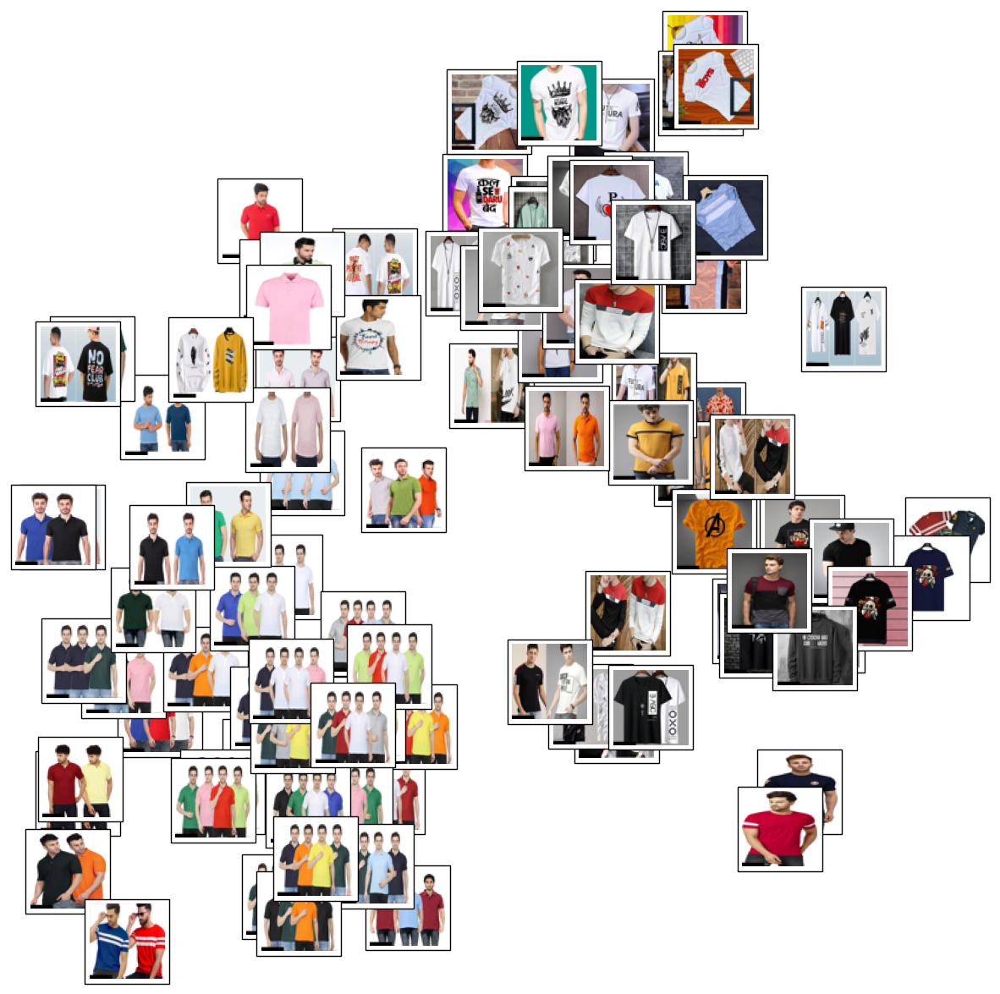

In [20]:
plot_components(data, TSNE(n_components=2, random_state=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

#### Isomap

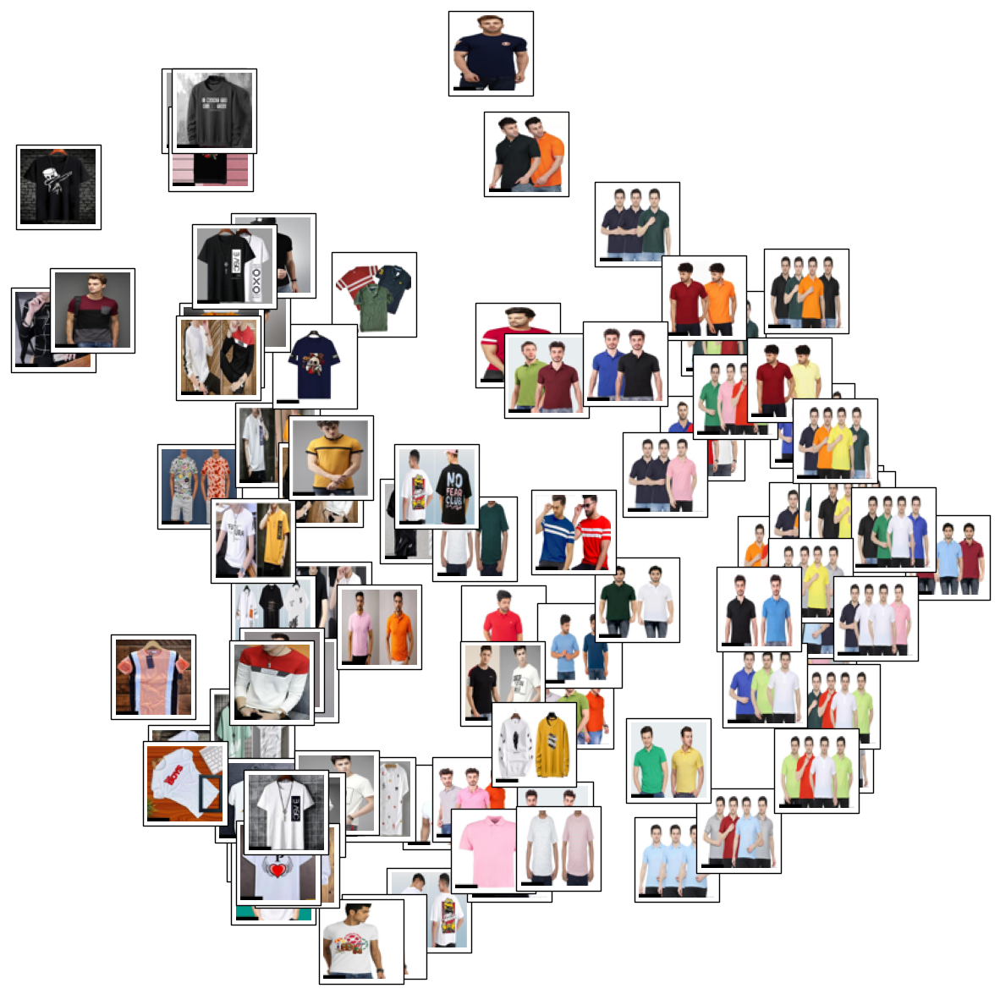

In [21]:
plot_components(data, Isomap(n_components=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

### Sarees__attr_4

In [23]:
data, images=load_data(basket['Sarees__attr_4'])

#### TSNE

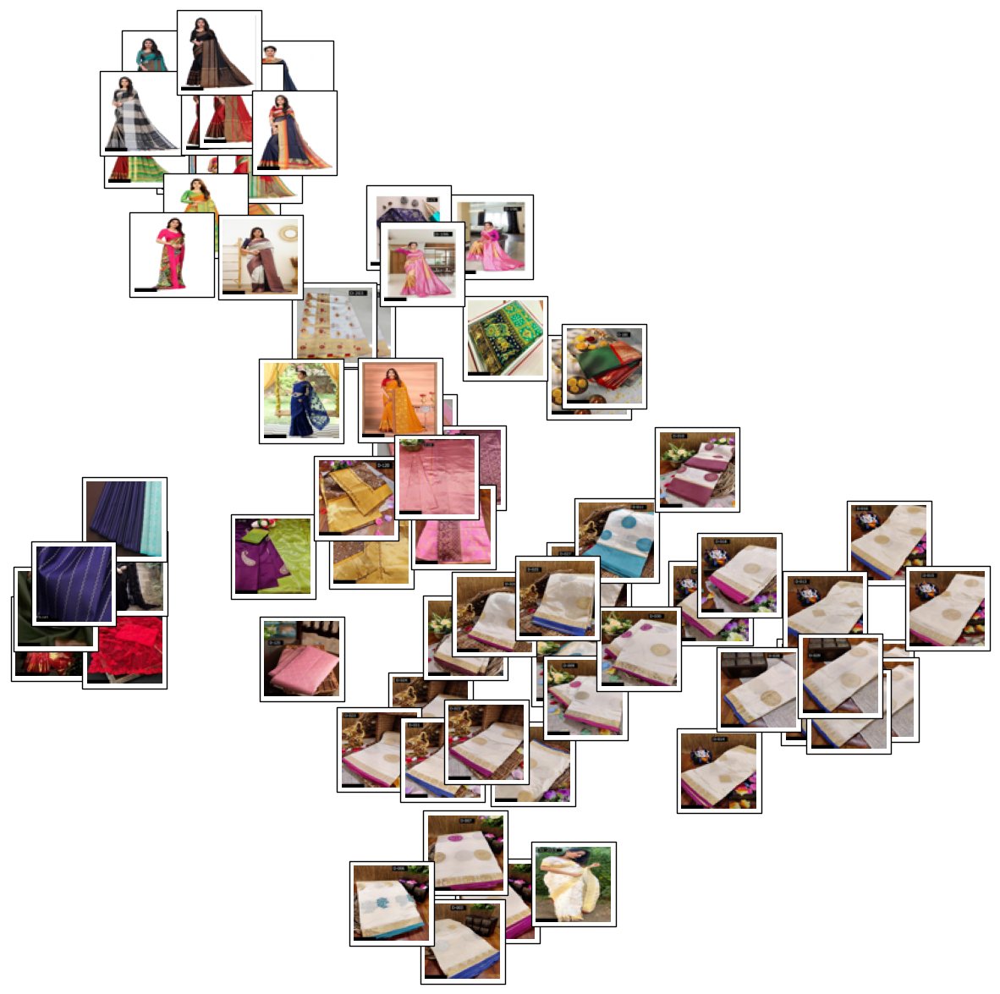

In [24]:
plot_components(data, TSNE(n_components=2, random_state=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

#### Isomap

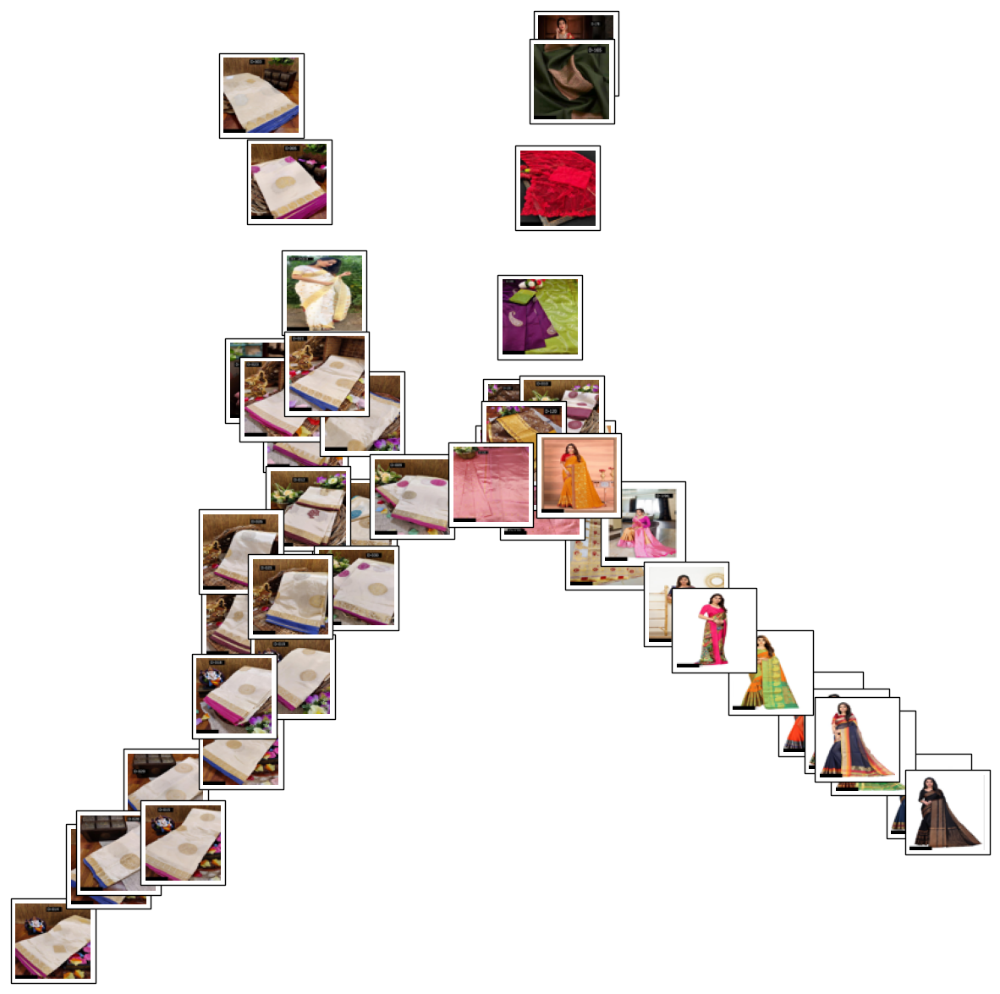

In [25]:
plot_components(data, Isomap(n_components=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

### Sarees__attr_9

In [26]:
data, images=load_data(basket['Sarees__attr_9'])

#### TSNE

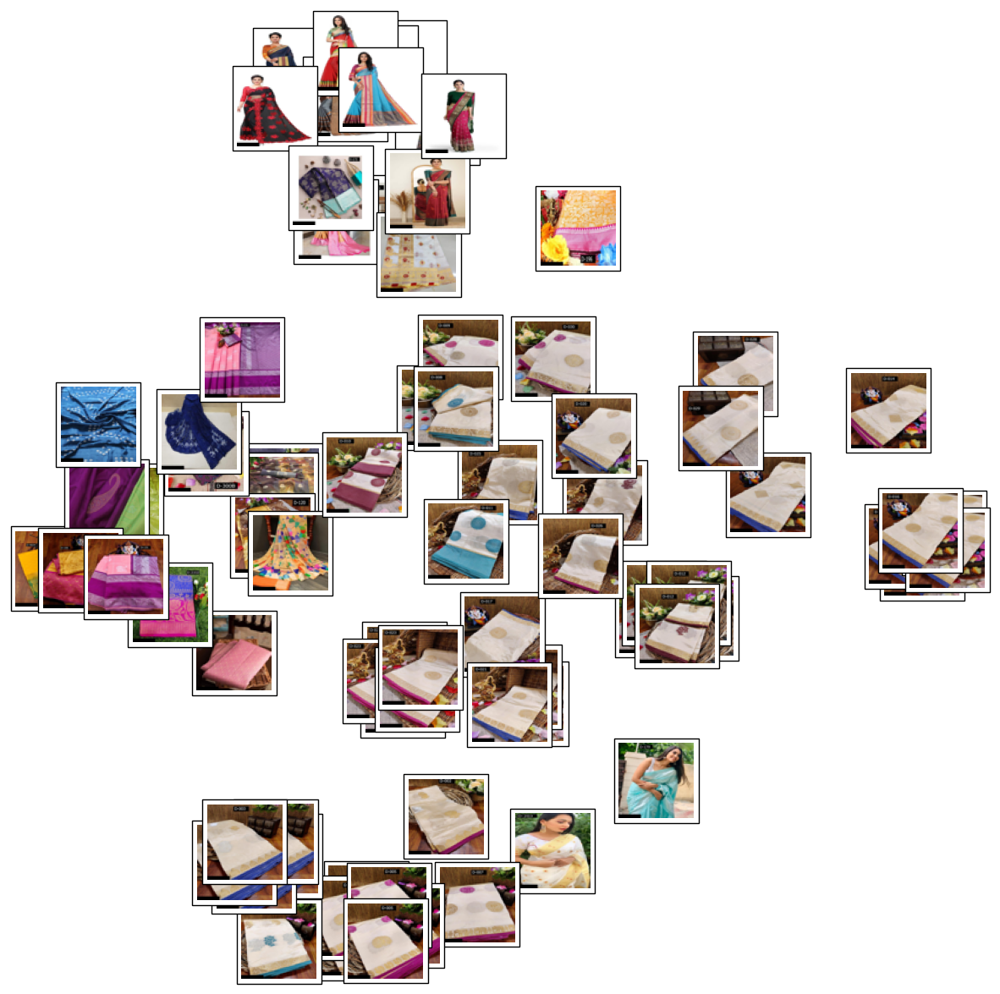

In [27]:
plot_components(data, TSNE(n_components=2, random_state=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

#### Isomap

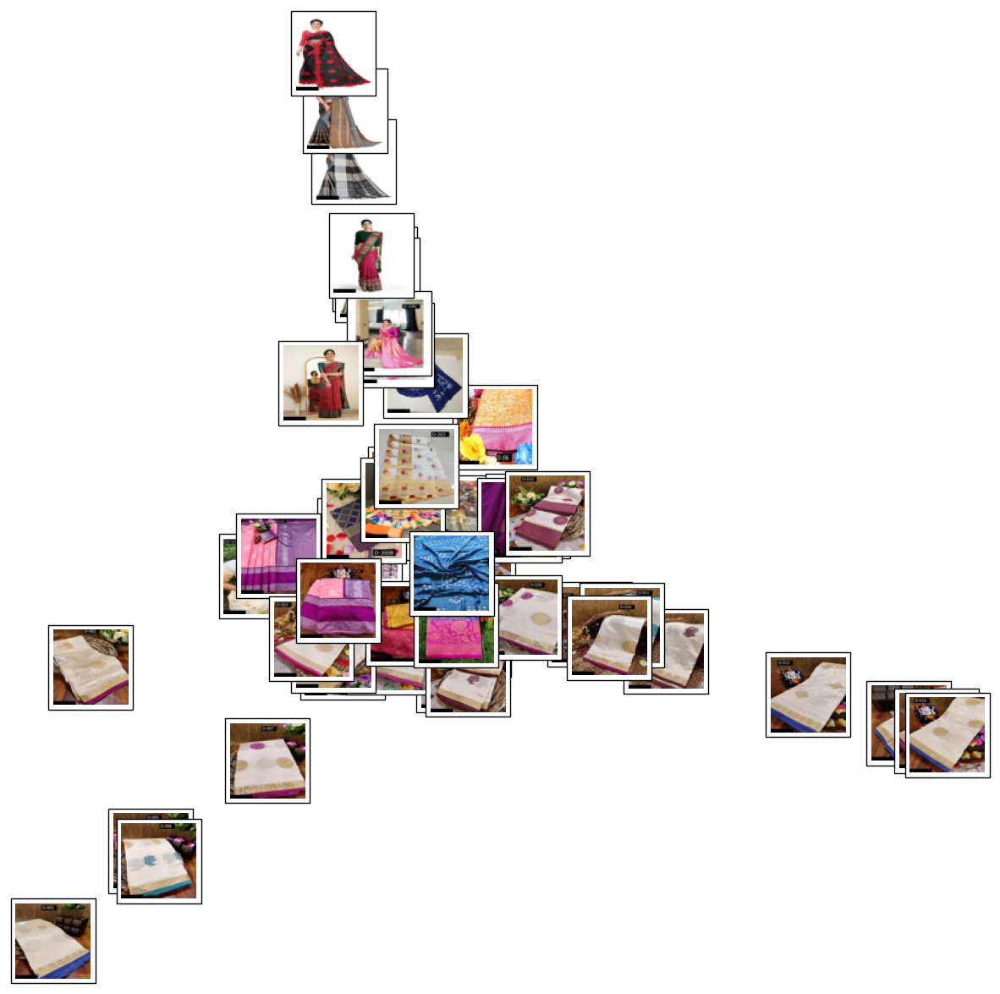

In [28]:
plot_components(data, Isomap(n_components=2, n_neighbors=8), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

### Kurtis__attr_1

In [29]:
data, images=load_data(basket['Kurtis__attr_1'])

#### TSNE

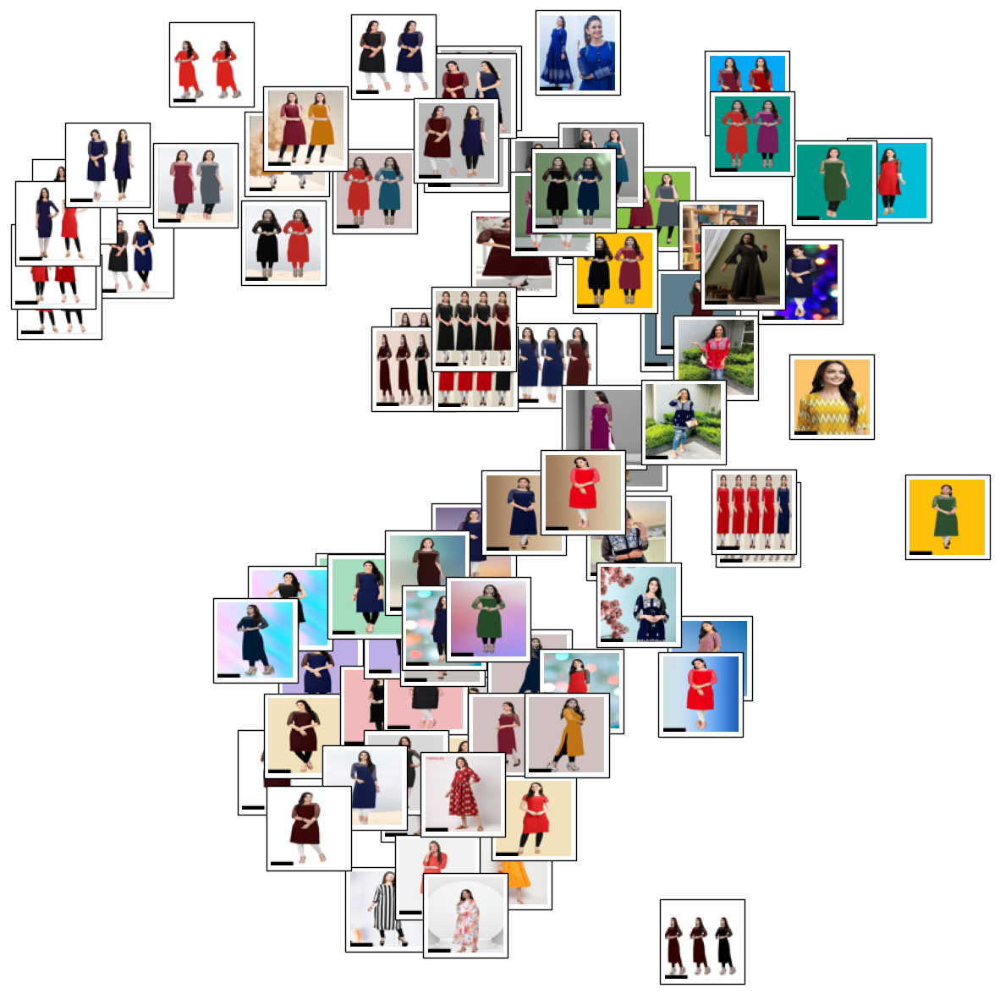

In [30]:
plot_components(data, TSNE(n_components=2, random_state=10), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

#### Isomap

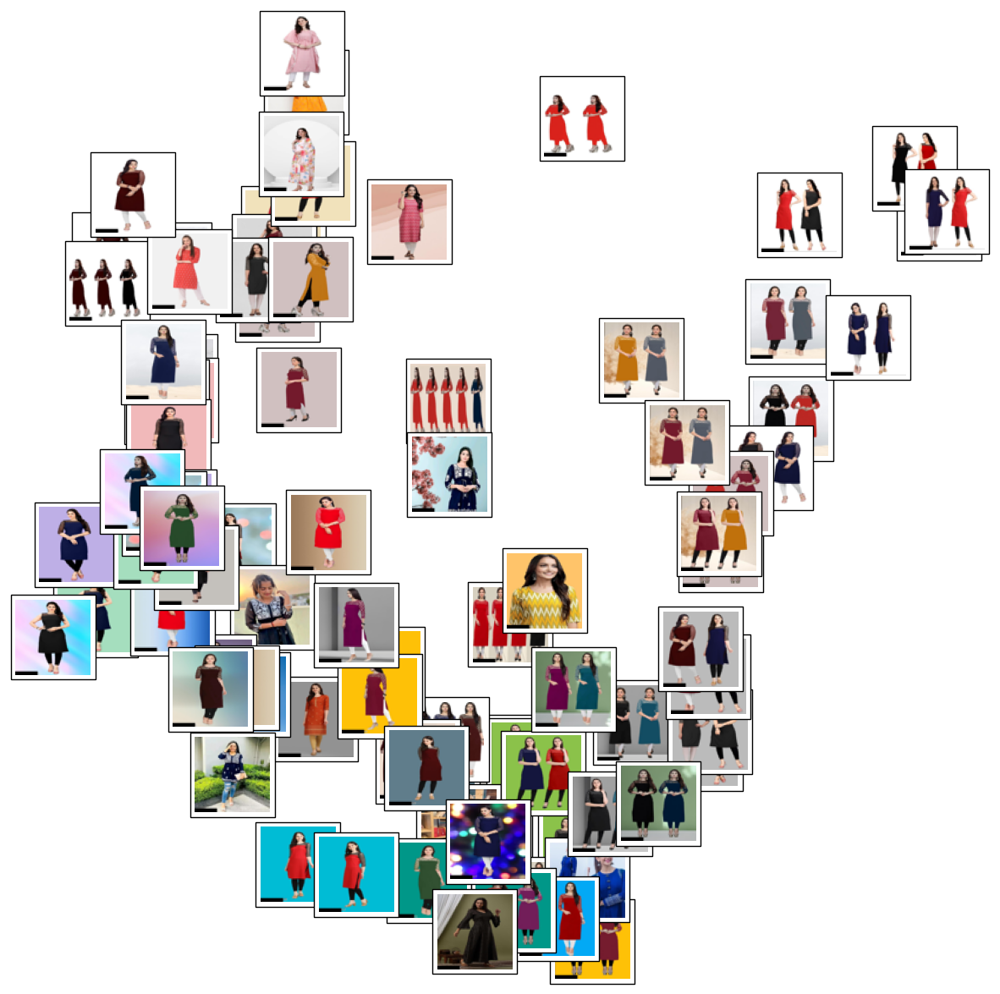

In [31]:
plot_components(data, Isomap(n_components=2, n_neighbors=8), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

### Kurtis__attr_8

In [33]:
data, images=load_data(basket['Kurtis__attr_8'])

#### TSNE

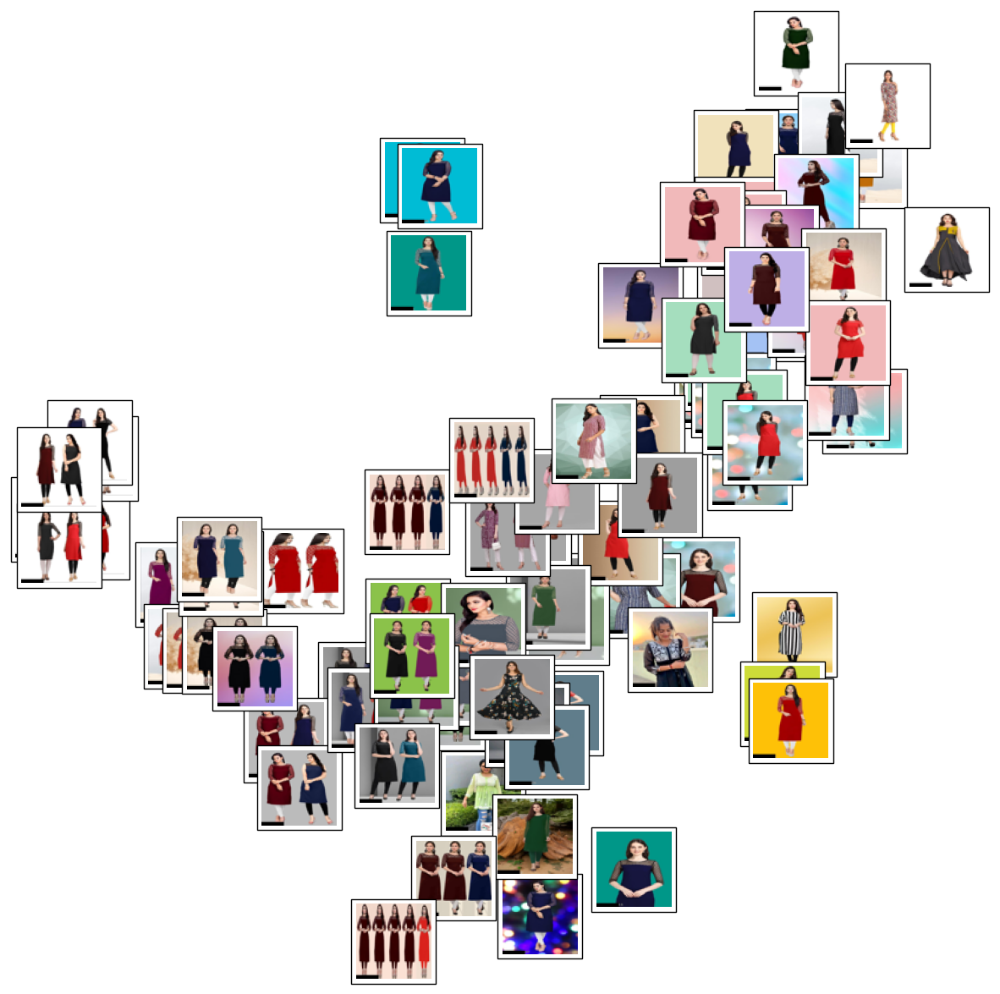

In [34]:
plot_components(data, TSNE(n_components=2, random_state=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

#### Isomap

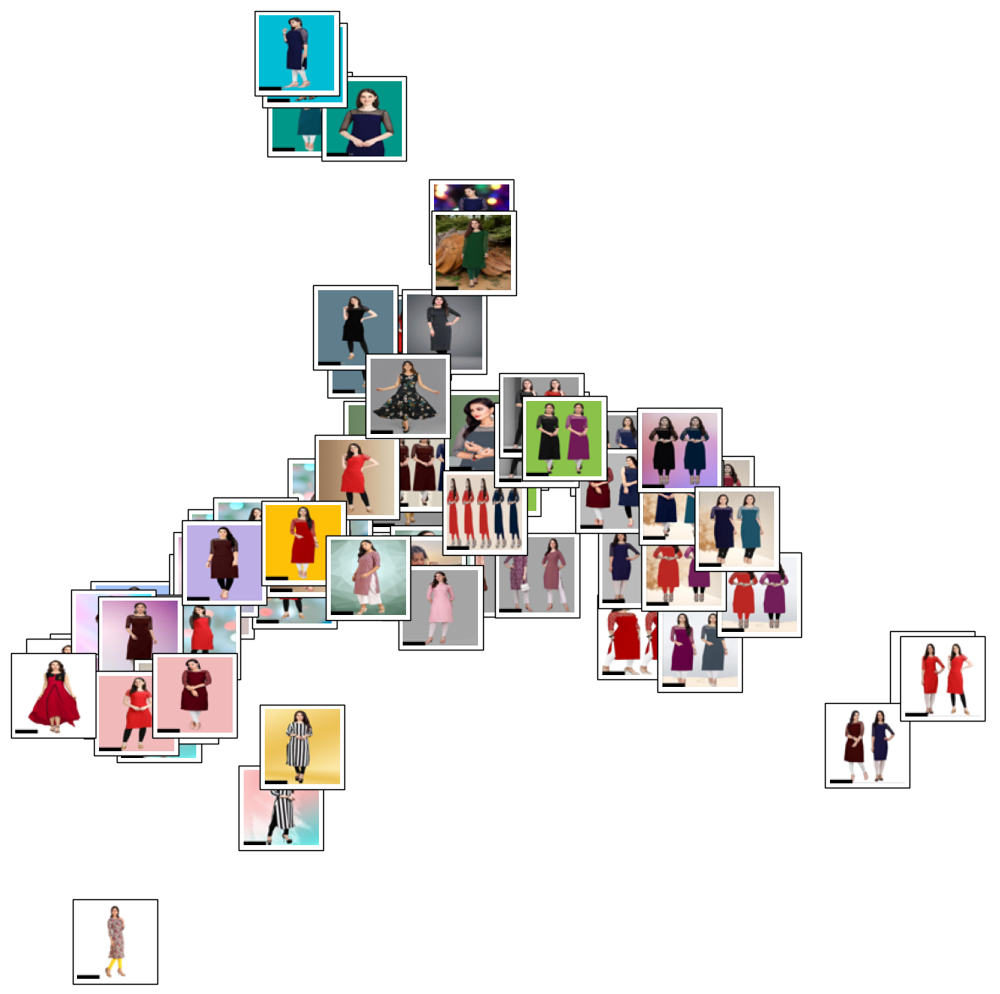

In [35]:
plot_components(data, Isomap(n_components=2, n_neighbors=8), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

### Women Tshirts__attr_1

In [36]:
data, images=load_data(basket['Women Tshirts__attr_1'])

#### TSNE

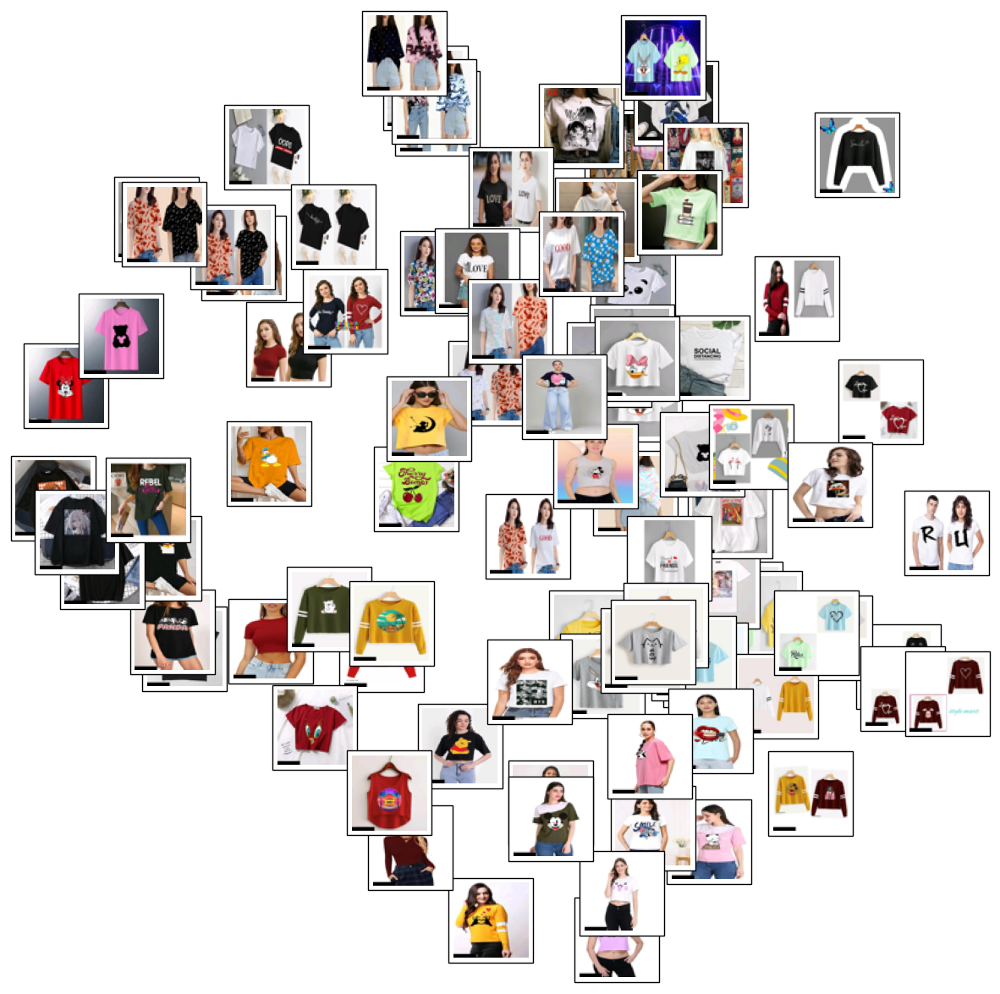

In [37]:
plot_components(data, TSNE(n_components=2, random_state=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

#### Isomap

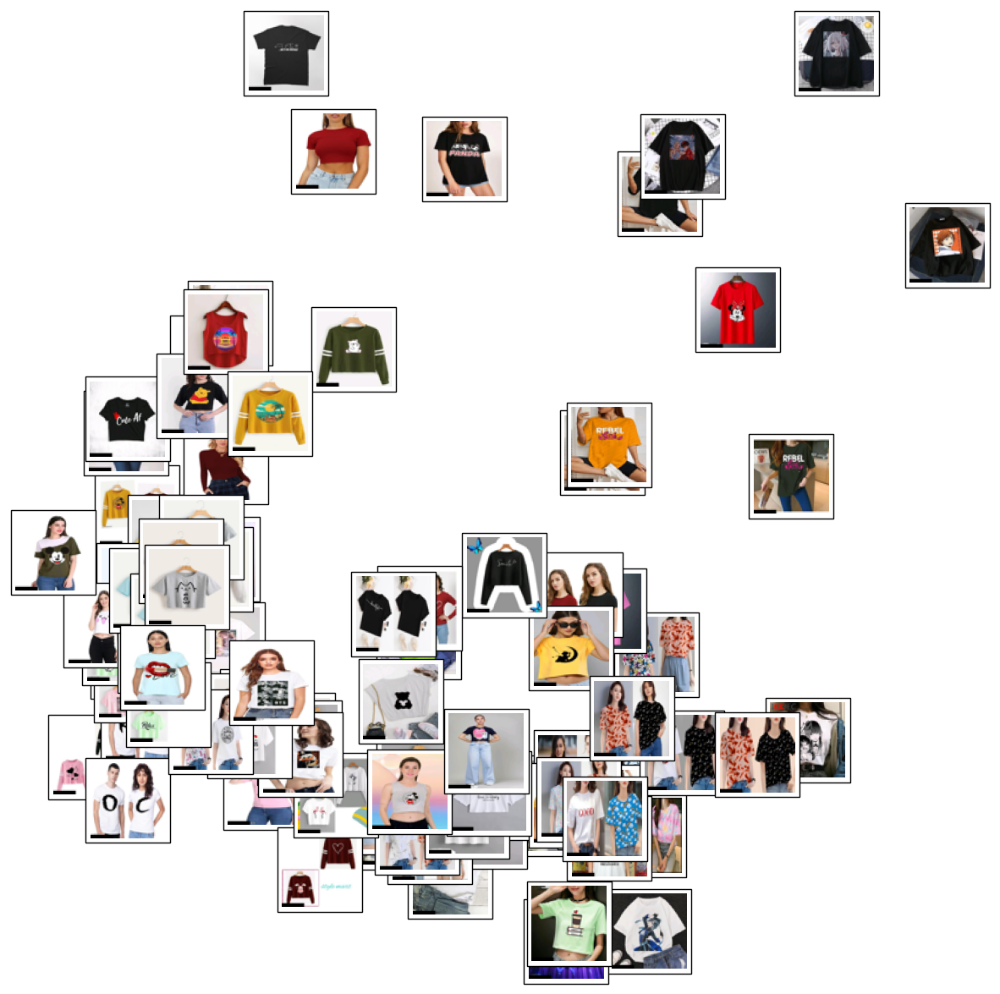

In [38]:
plot_components(data, Isomap(n_components=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

### Women Tshirts__attr_5

In [39]:
data, images=load_data(basket['Women Tshirts__attr_5'])

#### TSNE

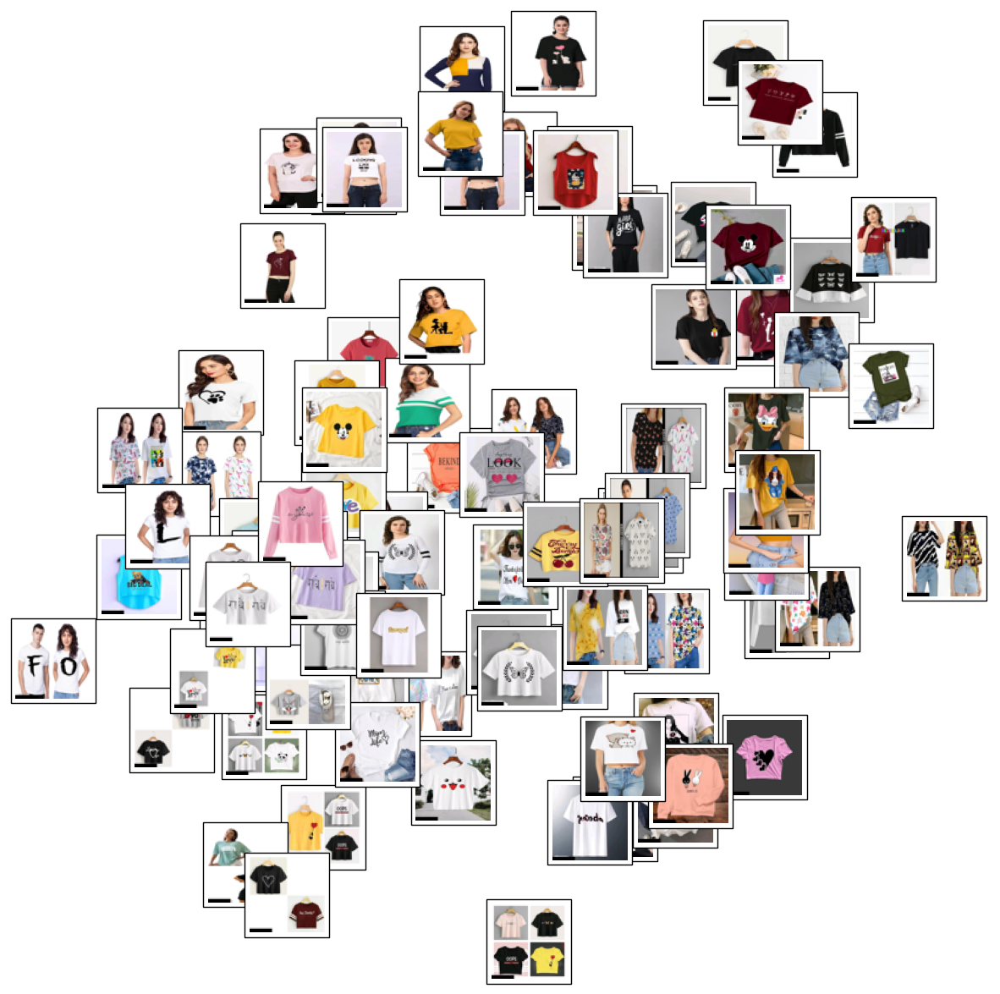

In [40]:
plot_components(data, TSNE(n_components=2, random_state=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

#### Isomap

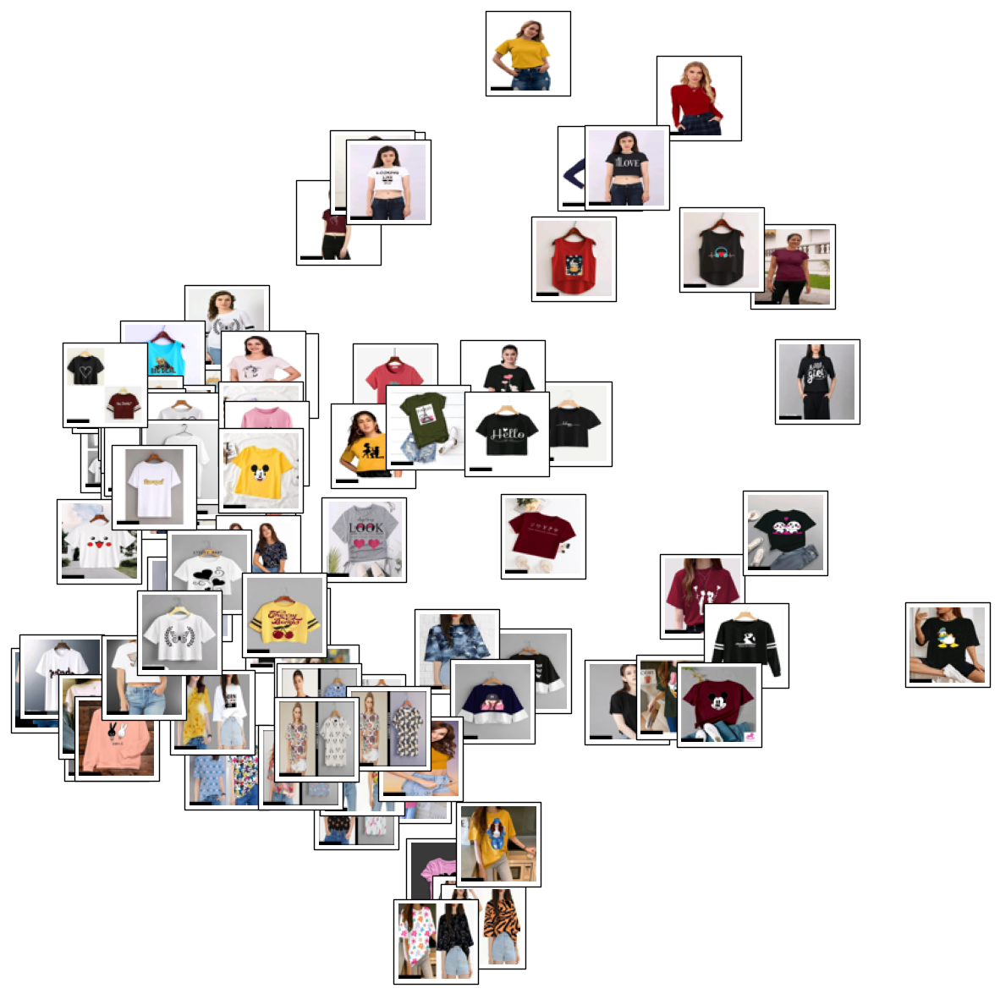

In [41]:
plot_components(data, Isomap(n_components=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

### Women Tops & Tunics__attr_1

In [42]:
data, images=load_data(basket['Women Tops & Tunics__attr_1'])

#### TSNE

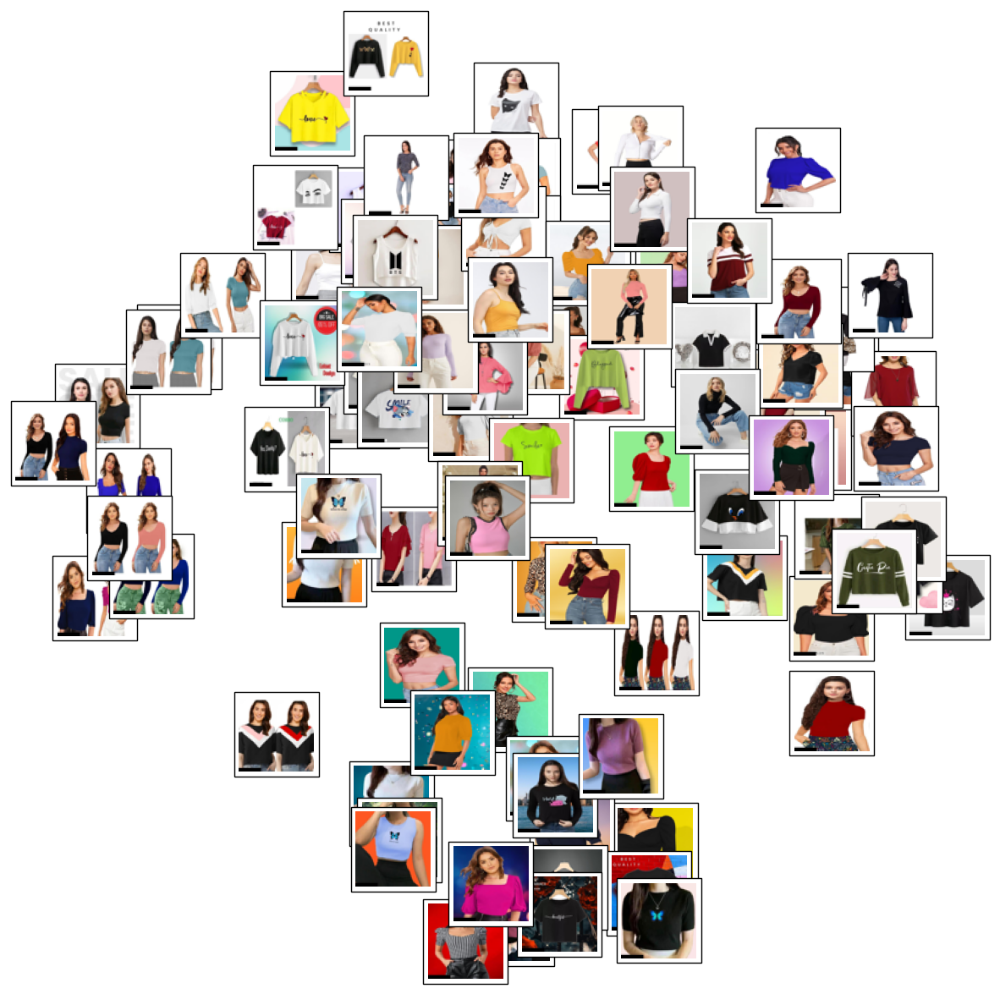

In [43]:
plot_components(data, TSNE(n_components=2, random_state=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

#### Isomap

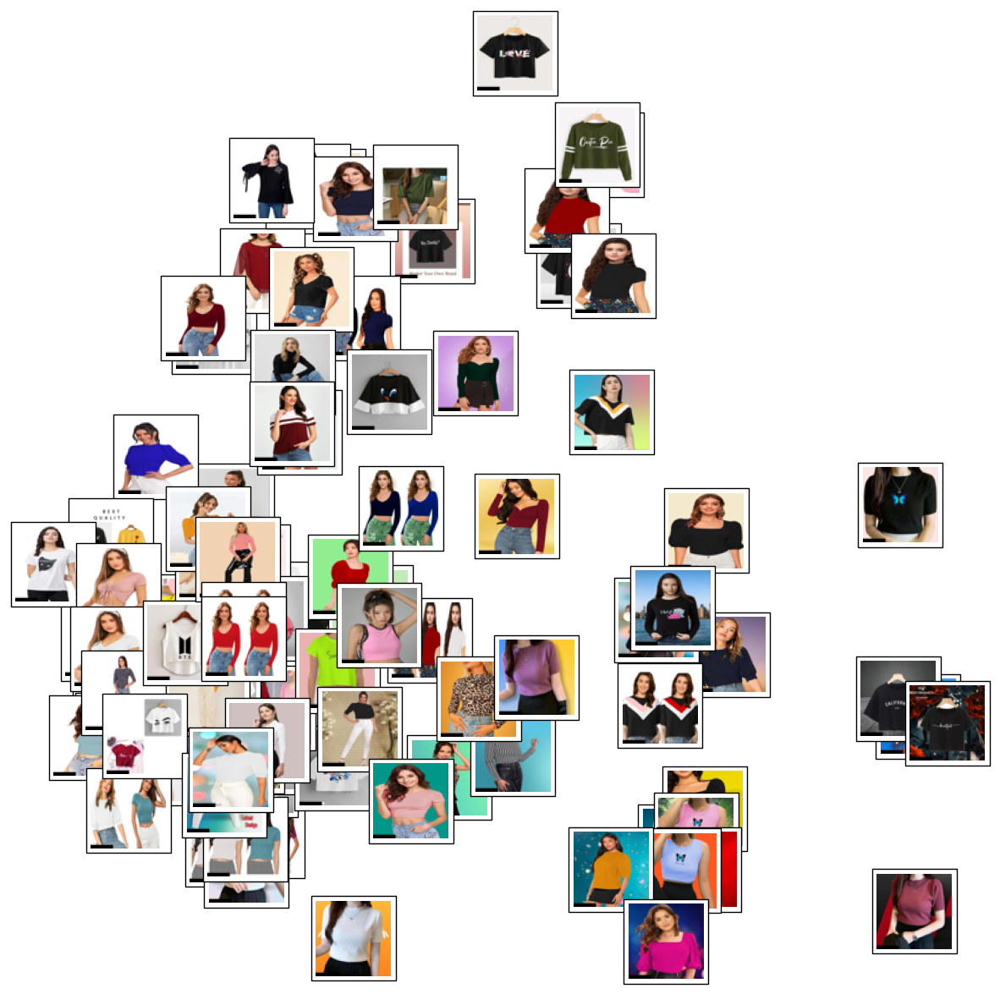

In [44]:
plot_components(data, Isomap(n_components=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

### Women Tops & Tunics__attr_8

In [45]:
data, images=load_data(basket['Women Tops & Tunics__attr_8'])

#### TSNE

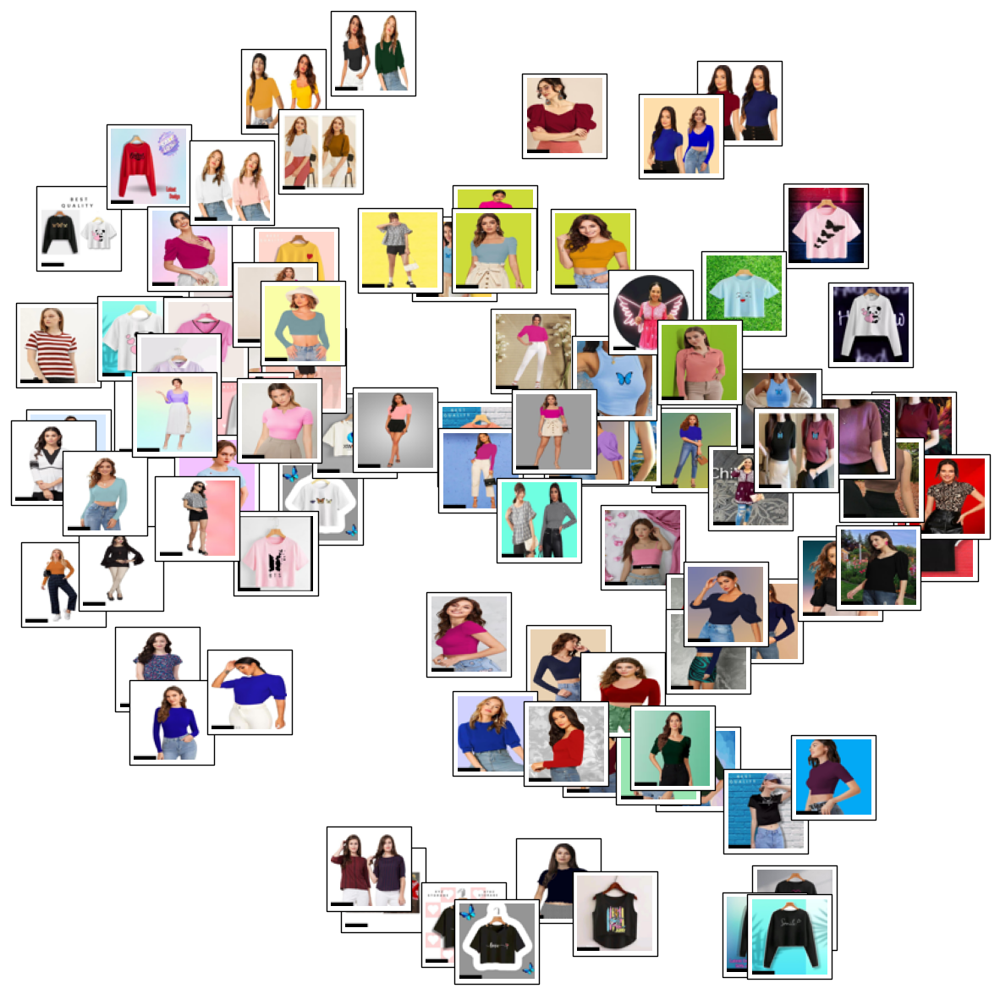

In [46]:
plot_components(data, TSNE(n_components=2, random_state=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

#### Isomap

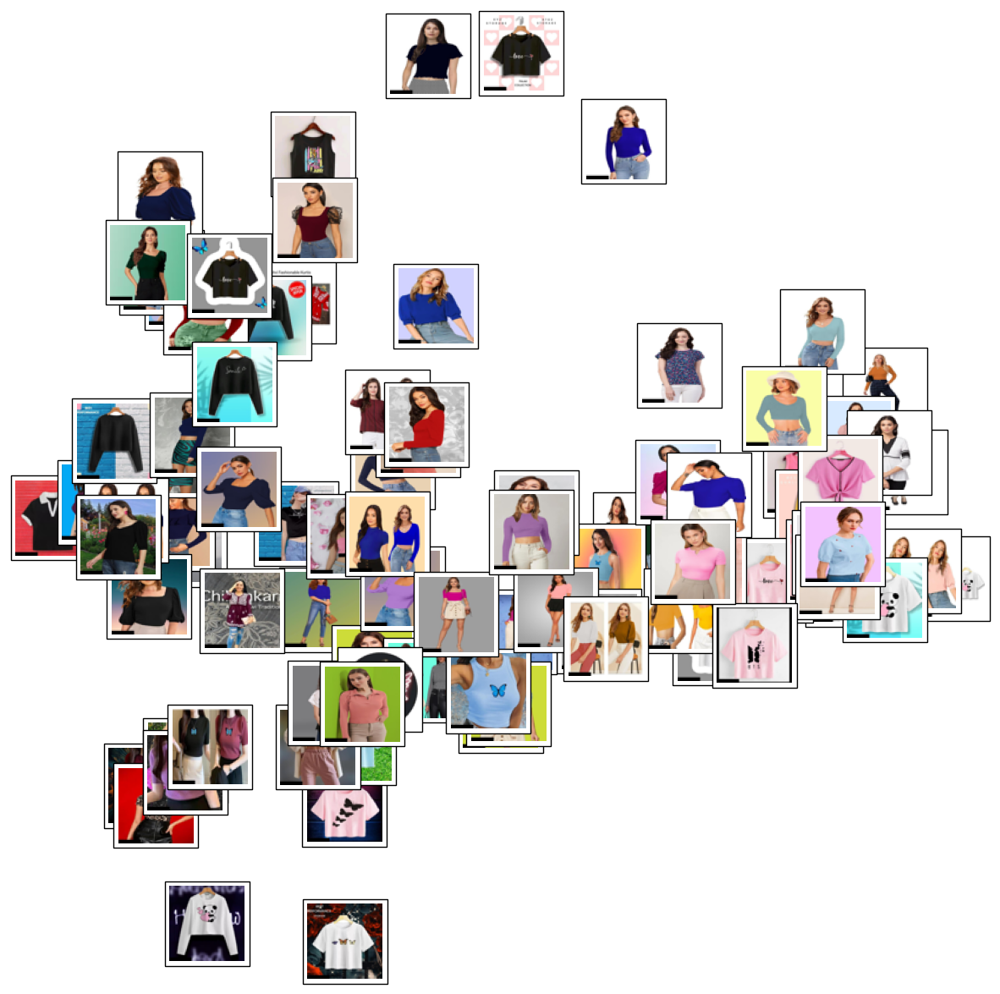

In [47]:
plot_components(data, Isomap(n_components=2), images=images, thumb_frac=0.01)
plt.gcf().set_size_inches(15, 15)

# Task 3

### Men Tshirts
##### attr_1:
* TSNE
    * x-axis : Light to Dark background. All the pictures in the left hand side of the plot have light backgroung (white in the extreme left), while all the pictures in the right have dark background (blck in the extreme right).
    * y-axis : Number of t-shirts in the photo graph. The lower half of the plot has 1-2 t-shirts per picture while the  upper half has 3-4 t-shirts per picture.
* Isomap
    * x-axis : Plain to Printed t-shirts. The left side has plain t-shirts and the right side has printed t-shirts.
    * y-axis : Can't Explain

##### attr_2:
* TSNE
    * x-axis : Plain to Printed. Same explanation as above.
    * y-axis : Black to white. All the pictures in the lower side have a black or a dark t-shirt, while all the pictures in to upper side have white or a light t-shirt.
* Isomap
    * x-axis : Printed to Plain. (Reverse of TSNE)
    * y-axis : White to Black (Reverse of TSNE)

### Sarees
##### attr_4
* TSNE
    * x-axis : Darker to lighter shades of sarees.
    * y-axis : Simple plain patterns to decorated patterns. All the sarees in the lower half have simple patterns while all sarees in the upper half have complex decorations and patterns.
* Isomap
    * x-axis : Light to dark colors of sarees.
    * y-axis : Can't explain.

##### attr_9
* Isomap
    * x-axis : Left Slanting(back-slash) to Right Slanting(forward-slash). All the sarees in the left hand side of the plot slant towards the left like a back-slash(\\), while all the sarees in the right hand side of the plot slant towards the right like a forward-slash(/)
    * y-axis : Lighter shade of sarees to darker shades of sarees.

### Kurtis
##### attr_1
* TSNE
    * The dimensions cannot be separarted out individually but some patterns are observed on the basis of which the clusters have been decided. These are : 
        1) The number of kurtis in a picture. 
        2) The type of background (light, dark, gradient)
        3) The printed or plain kurti.
    Two components are not enough to distinguish the clusters.
* Isomap
    * x-axis : can't explain
    * y-axis : The background of the picture (Dark to Light). Dark background images are in the lower half of the plot while the white/light background pictures are in the top half.

##### attr_8
* Isomap
    * x-axis : Number of kurtis in a picture. The pictures on the left hand side of the plot have 1 kurti per picture and as we move to the right side of the plot the pictures have 2 kurtis per picture.
    * y-axis : The background of the picture. The lower side of the plot has pictures that contain white backround. As we move up the plot, we encounter pictures that have gradient backdrounds, and the top section contains solid dark backgrounds.

### Women Tshirts
##### attr_1
* Isomap
    * x-axis : can't explain
    * y-axis : Light to Dark colors of the t-shirts.

##### attr_5
* Isomap
    * x-axis : Light to Dark colors of the t-shirts.
    * y-axis : can't explain

### Women Tops & Tunics
##### attr_1
* TSNE
    * x-axis : The number of tunics (higher to lower). The left side has more than 1 tunic per picture, while the right side has 1 tunic per picture.
    * y-axis : Background Color (dark to light). The pictures present in the lower side have darker backgrounds while the pictures present in the top side of the plot have whiter backgrounds.

* Isomap
    * x-axis : Background Color (light to dark, reverse of tsne).
    * y-axis : can't explain

##### attr_8
* TSNE
    * x-axis : Background Color (light to dark). The pictures present in the left side have lighter backgrounds while the pictures present in the right side of the plot have darker backgrounds.
    * y-axis : can't explain

* Isomap
    * x-axis : Dark to light colors of the tunics
    * y-axis : Dark patterns to light patterns. The tunics in the lower part of the plot have darker patterns/prints on them while the tunic on the upper part of the plot have lighter patterns/prints on them.